# Lab 1: Independent Component Analysis

### Machine Learning 2 (2019)

* The lab exercises can be done in groups of two people, or individually.
* The deadline is Tuesday September 17th, 16:59.
* Assignment should be submitted through Canvas! Make sure to include your and your teammates' names with the submission.
* Attach the .IPYNB (IPython Notebook) file containing your code and answers. Naming of the file should be "studentid1\_studentid2\_lab#", for example, the attached file should be "12345\_12346\_lab1.ipynb". Only use underscores ("\_") to connect ids, otherwise the files cannot be parsed.

Notes on implementation:

* You should write your code and answers in an IPython Notebook: http://ipython.org/notebook.html. If you have problems, please ask.
* Use __one cell__ for code and markdown answers only!
    * Put all code in the cell with the ```# YOUR CODE HERE``` comment and overwrite the ```raise NotImplementedError()``` line.
    * For theoretical questions, put your solution using LaTeX style formatting in the YOUR ANSWER HERE cell.
* Among the first lines of your notebook should be "%pylab inline". This imports all required modules, and your plots will appear inline.
* Large parts of you notebook will be graded automatically. Therefore it is important that your notebook can be run completely without errors and within a reasonable time limit. To test your notebook before submission, select Kernel -> Restart \& Run All.

### Literature
In this assignment, we will implement the Independent Component Analysis algorithm as described in chapter 34 of David MacKay's book "Information Theory, Inference, and Learning Algorithms", which is freely available here:
http://www.inference.phy.cam.ac.uk/mackay/itila/book.html

Read the ICA chapter carefuly before you continue!

### Notation

$\mathbf{X}$ is the $M \times T$ data matrix, containing $M$ measurements at $T$ time steps.

$\mathbf{S}$ is the $S \times T$ source matrix, containing $S$ source signal values at $T$ time steps. We will assume $S = M$.

$\mathbf{A}$ is the mixing matrix. We have $\mathbf{X} = \mathbf{A S}$.

$\mathbf{W}$ is the matrix we aim to learn. It is the inverse of $\mathbf{A}$, up to indeterminacies (scaling and permutation of sources).

$\phi$ is an elementwise non-linearity or activation function, typically applied to elements of $\mathbf{W X}$.

### Code
In the following assignments, you can make use of the signal generators listed below.



In [1]:
%pylab inline
import sys
assert sys.version_info[:3] >= (3, 6, 0), "Make sure you have Python 3.6 installed"

# Signal generators
def sawtooth(x, period=0.2, amp=1.0, phase=0.):
    return (((x / period - phase - 0.5) % 1) - 0.5) * 2 * amp

def sine_wave(x, period=0.2, amp=1.0, phase=0.):
    return np.sin((x / period - phase) * 2 * np.pi) * amp

def square_wave(x, period=0.2, amp=1.0, phase=0.):
    return ((np.floor(2 * x / period - 2 * phase - 1) % 2 == 0).astype(float) - 0.5) * 2 * amp

def triangle_wave(x, period=0.2, amp=1.0, phase=0.):
    return (sawtooth(x, period, 1., phase) * square_wave(x, period, 1., phase) + 0.5) * 2 * amp

def random_nonsingular_matrix(d=2):
    """
    Generates a random nonsingular (invertible) matrix of shape d*d
    """
    epsilon = 0.1
    A = np.random.rand(d, d)
    while abs(np.linalg.det(A)) < epsilon:
        A = np.random.rand(d, d)
    return A

def plot_signals(X, title="Signals"):
    """
    Plot the signals contained in the rows of X.
    """
    figure()
    
    for i in range(X.shape[0]):
        ax = plt.subplot(X.shape[0], 1, i + 1)
        plot(X[i, :])
        ax.set_xticks([])
        ax.set_yticks([])
    plt.suptitle(title)

Populating the interactive namespace from numpy and matplotlib


The following code generates some toy data to work with.

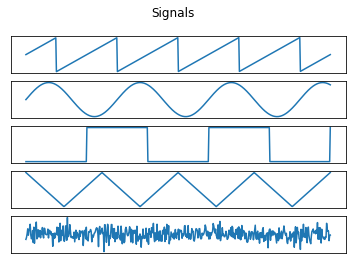

In [2]:
# Generate data
num_sources = 5
signal_length = 500
t = linspace(0, 1, signal_length)
S = np.c_[sawtooth(t), sine_wave(t, 0.3), square_wave(t, 0.4), triangle_wave(t, 0.25), np.random.randn(t.size)].T
plot_signals(S)

### 1.1 Make mixtures (5 points)
Write a function `make_mixtures(S, A)' that takes a matrix of source signals $\mathbf{S}$ and a mixing matrix $\mathbf{A}$, and generates mixed signals $\mathbf{X}$.

In [3]:
### 1.1 Make mixtures
def make_mixtures(S, A):
    return A @ S

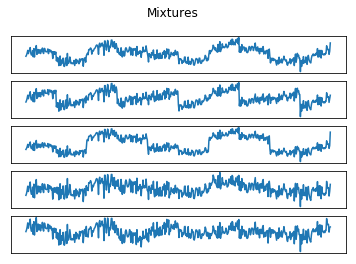

In [4]:
### Test your function
np.random.seed(42)
A = random_nonsingular_matrix(d=S.shape[0])
X = make_mixtures(S, A)
plot_signals(X, "Mixtures")

assert X.shape == (num_sources, signal_length), "The shape of your mixed signals is incorrect"


### 1.2 Histogram (5 points)
Write a function `plot_histograms(X)` that takes a data-matrix $\mathbf{X}$ and plots one histogram for each signal (row) in $\mathbf{X}$. You can use the `np.histogram()` (followed by `plot`) or `plt.hist()` function. 

Plot histograms of the sources and the measurements.

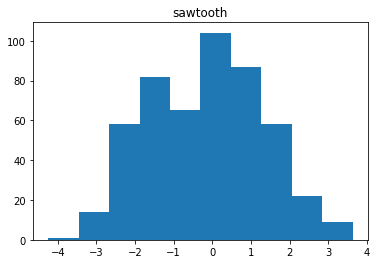

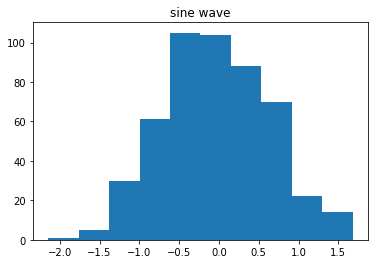

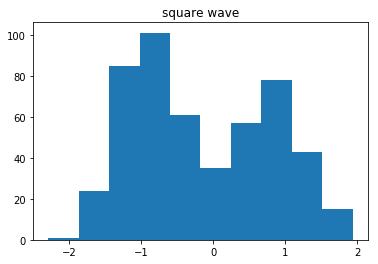

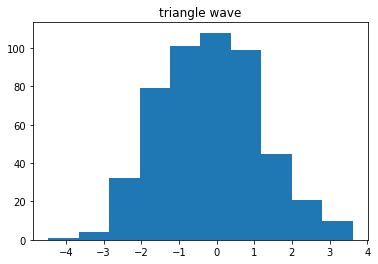

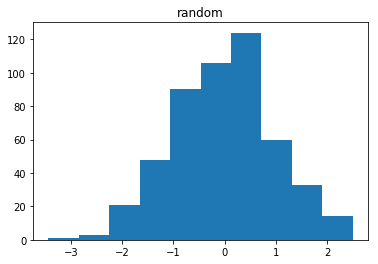

In [5]:
### 1.2 Histogram
def plot_histograms(X, titles=None):
    for ind, row in enumerate(X):
        plt.hist(row)
        if titles is not None:
            plt.title(titles[ind])
        plt.show()

titles = ['sawtooth', 'sine wave', 'square wave', 'triangle wave', 'random']
plot_histograms(X, titles)


Which of these distributions (sources or measurements) tend to look more like Gaussians? Can you think of an explanation for this phenomenon? Why is this important for ICA?

$\textbf{Answer}$: Since the mixing matrix was generated by a random process and since the number of samples in it is relatively large, the central limit theorem applies. Because of it, the distribution of values in it resembles a Gaussian. Hence, all signals from the source matrix perturbed by the mixing matrix also resemble a Gaussian, with the exception of the square wave, that essentially eliminates half of the signal in the mixing matrix, therefore distorting the distribution of values. 

### 1.3 Implicit priors (20 points)
As explained in MacKay's book, an activation function $\phi$ used in the ICA learning algorithm corresponds to a prior distribution over sources. Specifically, $\phi(a) = \frac{d}{da} \ln p(a)$. For each of the following activation functions, *derive* the source distribution they correspond to.
$$\phi_0(a) = -\tanh(a)$$
$$\phi_1(a) = -a + \tanh(a)$$
$$\phi_2(a) = -a^3$$
$$\phi_3(a) = -\frac{6a}{a^2 + 5}$$

Give your answer without the normalizing constant, so an answer of the form $p(a) \propto \verb+[answer]+$ is ok.

$\textbf{Answer}$: If the activation function is defined as $\phi(a) = \frac{d}{da} \ln p(a)$, then the source distribution can be calculated as its integral $\ln p(a) = \int\phi(a)da$, hence $\phi(a) = \exp(\int\phi(a)da)$. More specifically, for the listed activation functions, the source distributions are as follows:

$$p_0(a) = \exp(\int-\tanh(a)da) \propto \frac{1}{cosh(a)}$$
$$p_1(a) = \exp(\int-a + \tanh(a)da) \propto cosh(a) \exp(-\frac{a^2}{2})$$
$$p_2(a) = \exp(\int-a^3da) \propto \exp(\frac{-a^4}{4})$$
$$p_3(a) = \exp(\int-\frac{6a}{a^2 + 5}da) \propto (a^2 + 5)^{-3}$$


In [6]:
def phi_0(a):
    return -np.tanh(a)

def p_0(a):
    return 1 / np.cosh(a)

In [7]:
def phi_1(a):
    return -a + np.tanh(a)

def p_1(a):
    return np.cosh(a) * np.exp(- (a**2) / 2) 

In [8]:
def phi_2(a):
    return -a**3

def p_2(a):
    return np.exp(- (a**4) / 4)

In [9]:
def phi_3(a):
    return -6*a / (a**2 + 5)

def p_3(a):
    return 1 / (a**2 + 5)**3

In [10]:
activation_functions = [phi_0, phi_1, phi_2, phi_3]
priors = [p_0, p_1, p_2, p_3]

a = np.linspace(-5, 5, 1000)
for prior in priors:
    assert prior(a).shape == (1000, ), "Wrong output shape"


Plot the activation functions and the corresponding prior distributions, from $a = -5$ to $5$ (hint: use the lists defined in the cell above). Compare the shape of the priors to the histogram you plotted in the last question.

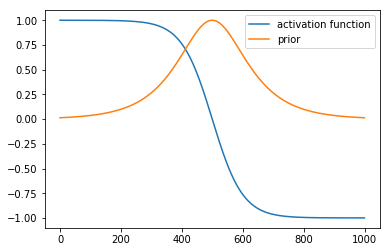

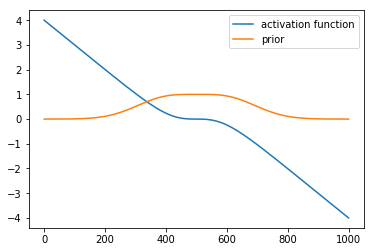

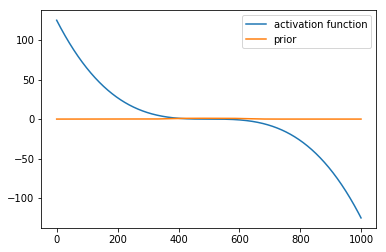

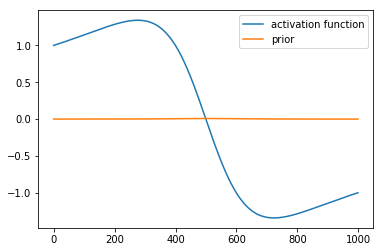

In [11]:
### 1.3 Implicit priors (continued)
a = np.linspace(-5, 5, 1000)

for no, activate in enumerate(activation_functions):
    plt.plot(activate(a))
    plt.plot(priors[no](a))
    plt.legend(['activation function','prior'])
    plt.show()    

### 1.4 Whitening (15 points)
Some ICA algorithms can only learn from whitened data. Write a method `whiten(X)` that takes a $M \times T$ data matrix $\mathbf{X}$ (where $M$ is the dimensionality and $T$ the number of examples) and returns a whitened matrix. If you forgot what whitening is or how to compute it, various good sources are available online, such as http://courses.media.mit.edu/2010fall/mas622j/whiten.pdf. Your function should also center the data before whitening.

In [12]:
### 1.4 Whitening
def whiten(X):
    # center the data
    X -= np.mean(X, axis=1, keepdims=True)
    
    # whitening performed per steps in above mentioned source
    X_cov = np.cov(X)  # produce the covariance matrix
    eigenvalues, eigenvectors = np.linalg.eig(X_cov)  # find the eigenvectors for decorrelation
    eigenvalues_ = np.diag(np.power(eigenvalues, -1/2)) # put the eigenvalues along the diagonal
    
    return (eigenvectors @ eigenvalues_).T @ X

In [13]:
### Test your function
Xw = whiten(X)
assert Xw.shape == (num_sources, signal_length), "The shape of your mixed signals is incorrect"


### 1.5 Interpret results of whitening (10 points)
Make 3 figures, one for the sources, one for measurements and one for the whitened measurements. In each figure, make $5 \times 5$ subplots with scatter plots for each pair of signals. Each axis represents a signal and each time-instance is plotted as a dot in this space. You can use the `plt.scatter()` function. Describe what you see.

Now compute and visualize the covariance matrix of the sources, the measurements and the whitened measurements. You can visualize each covariance matrix using this code:
```python
# Dummy covariance matrix C;
C = np.eye(5)  
ax = imshow(C, cmap='gray', interpolation='nearest')
```

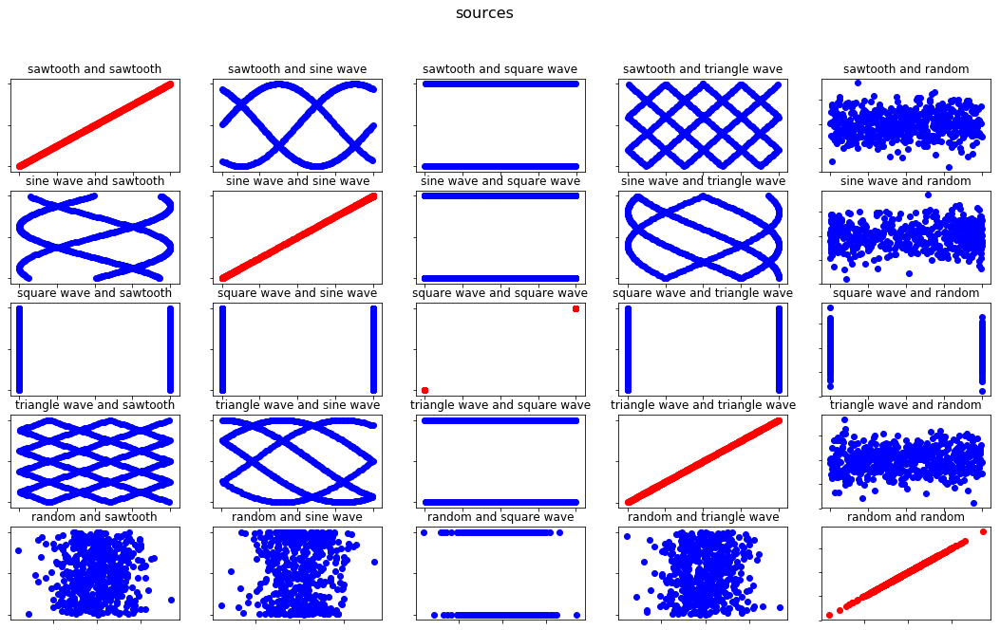

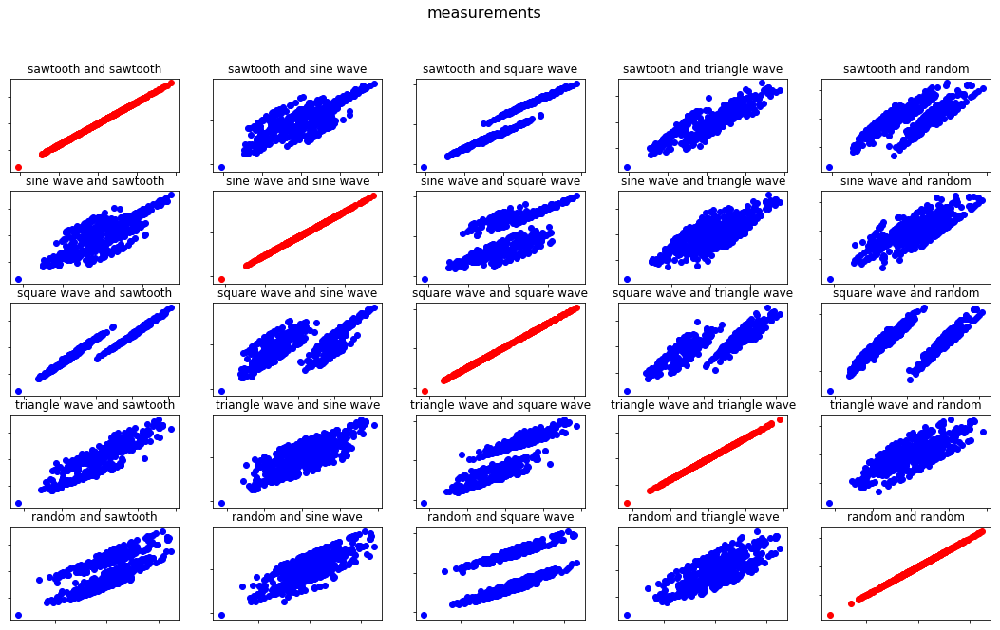

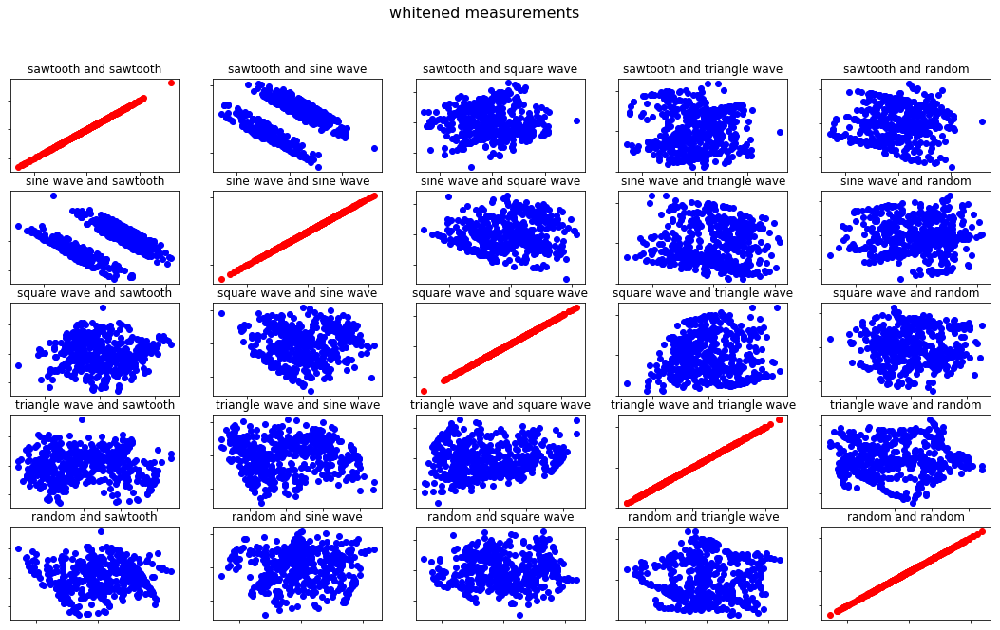

In [14]:
### 1.5 Interpret results of whitening

def plot_scatters(matrix, titles=None, title=None):
    fig, ax = plt.subplots(matrix.shape[0],matrix.shape[0])
    fig.set_size_inches(18.5, 10.5)
    fig.suptitle(title, fontsize=16)
    for no1, axis1 in enumerate(matrix):
        for no2, axis2 in enumerate(matrix):
            if no1 == no2:
                color_set = 'r'
            else:
                color_set = 'b'
            ax[no1,no2].scatter(axis1, axis2, c=color_set)
            if titles is not None:
                ax[no1,no2].set_title(titles[no1] + ' and ' + titles[no2])
                ax[no1,no2].set_yticklabels([])
                ax[no1,no2].set_xticklabels([])

            
                
plot_scatters(S, titles, 'sources')
plot_scatters(X, titles, 'measurements')
plot_scatters(Xw, titles, 'whitened measurements')

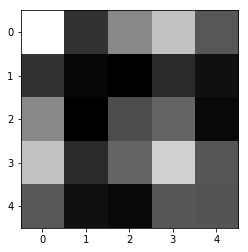

In [15]:
def plot_covariance(C):
    covariance = np.cov(C)
    ax = imshow(covariance, cmap='gray', interpolation='nearest')

plot_covariance(X)

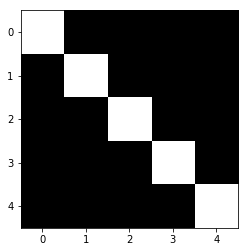

In [16]:
plot_covariance(Xw)

Are the signals independent after whitening?

$\textbf{Answer}:$ Yes, as can be seen on the third plot, the points on the scatterplot are evenly distributed across the whole space, indicating that there is no correlation between the rows in the whitened matrix. This can be also observed on the plotted covariances.

### 1.6 Covariance (5 points)
Explain what a covariant algorithm is. 

$\textbf{Answer}:$ A covariant algorithm is an algorithm that produces the same results, independent of the units in which quantities are measured.

### 1.7 Independent Component Analysis (25 points)
Implement the covariant ICA algorithm as described in MacKay. Write a function `ICA(X, activation_function, learning_rate)`, that returns the demixing matrix $\mathbf{W}$. The input `activation_function` should accept a function such as `lambda a: -tanh(a)`. Update the gradient in batch mode, averaging the gradients over the whole dataset for each update. Make it efficient, so use matrix operations instead of loops where possible (loops are slow in interpreted languages such as python and matlab, whereas matrix operations are internally computed using fast C code). Experiment with the learning rate and the initialization of $\mathbf{W}$. Your algorithm should be able to converge (i.e. `np.linalg.norm(grad) < 1e-5`) in within 10000 steps.

In [25]:
### 1.7 Independent Component Analysis
def ICA(X, activation_function, learning_rate=0.25, verbose=True, print_every=500, return_steps=False):
    # YOUR CODE HERE
    # raise NotImplementedError()
    M, T = X.shape
    max_steps = 10000
    
    # initialize random weights W
    W = np.eye(M)
    #W = random_nonsingular_matrix(M) <--- Does not work for phi_2?!
    
    # ensure learning_rate is not too high
    if learning_rate >= 1:
        learning_rate = 0.25
        
    if verbose:
        print('#' * 30)
        print('#' * 8 + ' Starting ICA ' + '#' * 8)
        print('#' * 30)
        print()
        print('Settings:')
        print(f'Activation function: {activation_function}')
        print(f'Learning rate: {learning_rate}')
        print()
    
    for step in range(max_steps):
        a = W @ X  # 1
        z = activation_function(a)  # 2
        x_ = W.T @ a  # 3
        
        # 4
        grad = W + ((z @ x_.T) / T)
        W += learning_rate * grad
        
        # check for convergence
        if np.linalg.norm(grad) < 1e-5:
            break
            
        if verbose:
            if print_every:
                if step % print_every == 0:
                    print(f'Step: {step}, grad: {np.linalg.norm(grad)}')
        
    # print verbose update
    if verbose:
        print()
        print(f'Done! ICA terminated with at the following step:')
        print(f'Step: {step}, grad: {np.linalg.norm(grad)}')
        print()
        print('#' * 30)
        print('#' * 9 + ' End of ICA ' + '#' * 9)
        print('#' * 30)
        print()
            
    if return_steps:
        return step
    
    return W
    

W_est = ICA(Xw, phi_3, learning_rate=0.25)  # Compare with ICA(X)
print(W_est)

##############################
######## Starting ICA ########
##############################

Settings:
Activation function: <function phi_3 at 0x0000020F208D00D0>
Learning rate: 0.25

Step: 0, grad: 0.36600228205486174
Step: 500, grad: 0.002096326913420767
Step: 1000, grad: 0.00016619282246131648
Step: 1500, grad: 1.2271230162201227e-05

Done! ICA terminated with at the following step:
Step: 1540, grad: 9.9583462332038e-06

##############################
######### End of ICA #########
##############################

[[ 0.53881707  0.52872302 -0.32501789  0.53125952  0.68244606]
 [-0.30090683  0.84632983  0.1116417  -0.70303301  0.18790923]
 [ 0.34852626  0.14951522  1.08764236  0.26701276 -0.04802018]
 [-0.91526974  0.28554566  0.07878563  0.72304629 -0.0511516 ]
 [-0.3512041  -0.52239697  0.274641   -0.19276459  0.98912114]]


In [26]:
# We will test your function so make sure it runs with only X and phi as input, and returns only W
# Also it should converge for all activation functions

W_estimates = [ICA(Xw, activation_function=phi, learning_rate=1.0) for phi in activation_functions]
assert all([W_est.shape == (num_sources, num_sources) for W_est in W_estimates])


##############################
######## Starting ICA ########
##############################

Settings:
Activation function: <function phi_0 at 0x0000020F208D0950>
Learning rate: 0.25

Step: 0, grad: 0.8280588179898418
Step: 500, grad: 0.0007107774870825193

Done! ICA terminated with at the following step:
Step: 756, grad: 9.837320715774609e-06

##############################
######### End of ICA #########
##############################

##############################
######## Starting ICA ########
##############################

Settings:
Activation function: <function phi_1 at 0x0000020F208D0B70>
Learning rate: 0.25

Step: 0, grad: 1.4232888734635285

Done! ICA terminated with at the following step:
Step: 437, grad: 9.970303643464362e-06

##############################
######### End of ICA #########
##############################

##############################
######## Starting ICA ########
##############################

Settings:
Activation function: <function phi_2 at 0x0000020F2

### 1.8 Experiments  (5 points)
Run ICA on the provided signals using each activation function $\phi_0, \ldots, \phi_3$ (or reuse `W_estimates`). Use the found demixing matrix $\mathbf{W}$ to reconstruct the signals and plot the retreived signals for each choice of activation function.

##############################
######## Starting ICA ########
##############################

Settings:
Activation function: <function phi_0 at 0x0000020F208D0950>
Learning rate: 0.25

Step: 0, grad: 0.8280588179898418
Step: 500, grad: 0.0007107774870825193

Done! ICA terminated with at the following step:
Step: 756, grad: 9.837320715774609e-06

##############################
######### End of ICA #########
##############################

##############################
######## Starting ICA ########
##############################

Settings:
Activation function: <function phi_1 at 0x0000020F208D0B70>
Learning rate: 0.25

Step: 0, grad: 1.4232888734635285

Done! ICA terminated with at the following step:
Step: 437, grad: 9.970303643464362e-06

##############################
######### End of ICA #########
##############################

##############################
######## Starting ICA ########
##############################

Settings:
Activation function: <function phi_2 at 0x0000020F2

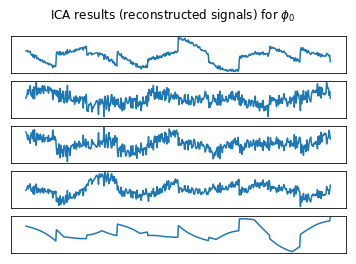

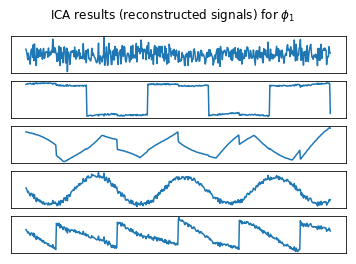

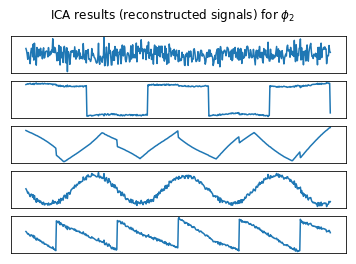

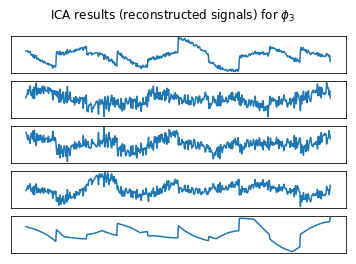

In [27]:
# 1.8 Experiments
# YOUR CODE HERE
# raise NotImplementedError()
for i, phi in enumerate(activation_functions):
    W_est = ICA(Xw, phi, verbose=True)
    S = W_est @ Xw
    plot_signals(S, f'ICA results (reconstructed signals) for $\phi_{i}$')

In [28]:
def does_whitening_make_a_difference():
    # Does it make a difference (in terms of speed of convergence) 
    # if you whiten your data before running ICA?
    
    # Return True or False
    # YOUR CODE HERE
    # raise NotImplementedError()
    
    # non-whitened
    nonw_steps = [ICA(X, phi, verbose=False, return_steps=True) for phi in activation_functions]
    
    # whitened
    w_steps = [ICA(Xw, phi, verbose=False, return_steps=True) for phi in activation_functions]
    
    return bool(np.mean(w_steps) < np.mean(nonw_steps))

does_whitening_make_a_difference()

C:\Users\Steven\Anaconda3\envs\ml2labs\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  


True

In [29]:
assert type(does_whitening_make_a_difference()) == bool

C:\Users\Steven\Anaconda3\envs\ml2labs\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in power
  


### 1.9 Audio demixing (10 points)
The 'cocktail party effect' refers to the ability humans have to attend to one speaker in a noisy room. We will now use ICA to solve a similar but somewhat idealized version of this problem. The code below loads 5 sound files and plots them.

Use a random non-singular mixing matrix to mix the 5 sound files. You can listen to the results in your browser using `play_signals`, or save them to disk if this does not work for you. Plot histograms of the mixed audio and use your ICA implementation to de-mix these and reproduce the original source signals. As in the previous exercise, try each of the activation functions.

Keep in mind that this problem is easier than the real cocktail party problem, because in real life there are often more sources than measurements (we have only two ears!), and the number of sources is unknown and variable. Also, mixing is not instantaneous in real life, because the sound from one source arrives at each ear at a different point in time. If you have time left, you can think of ways to deal with these issues.

In [30]:
import scipy.io.wavfile
from IPython.display import Audio, display, Markdown

# Save mixtures to disk, so you can listen to them in your audio player
def save_wav(data, out_file, rate):
    scaled = np.int16(data / np.max(np.abs(data)) * 32767)
    scipy.io.wavfile.write(out_file, rate, scaled)

# Or play them in your browser
def play_signals(S, sample_rate, title="Signals"):
    display(Markdown(title))
    for signal in S:
        display(Audio(signal, rate=sample_rate))

Signals

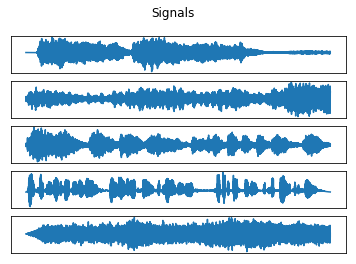

In [31]:
# Load audio sources
source_files = ['beet.wav', 'beet9.wav', 'beet92.wav', 'mike.wav', 'street.wav']
wav_data = []
sample_rate = None
for f in source_files:
    sr, data = scipy.io.wavfile.read(f, mmap=False)
    if sample_rate is None:
        sample_rate = sr
    else:
        assert(sample_rate == sr)
    wav_data.append(data[:190000])  # cut off the last part so that all signals have same length

# Create source and measurement data
S_audio = np.c_[wav_data]
plot_signals(S_audio)
play_signals(S_audio, sample_rate)

##################################################
################## Non-whitened ##################
##################################################

Histograms of the mixed audio


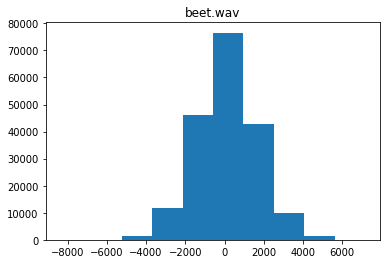

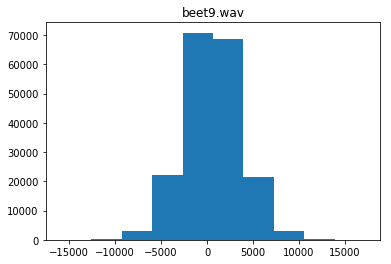

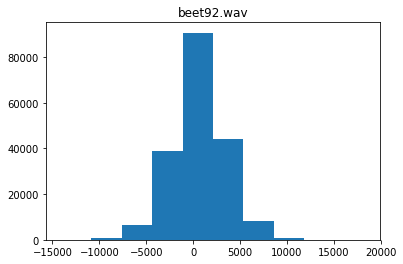

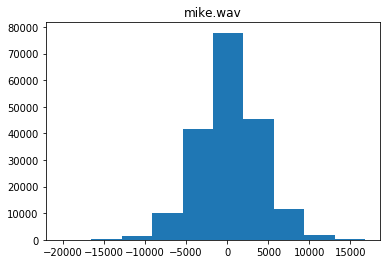

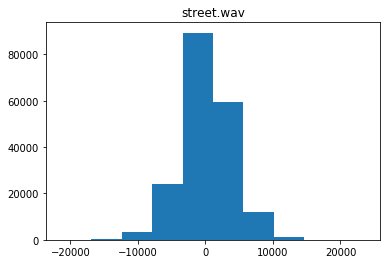

Mixed audio signals

##################################################
#################### Whitened ####################
##################################################

Histograms of the whitened mixed audio


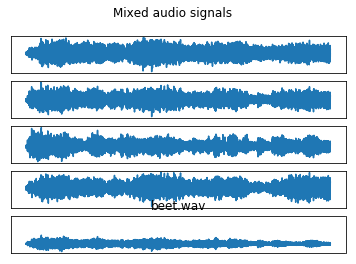

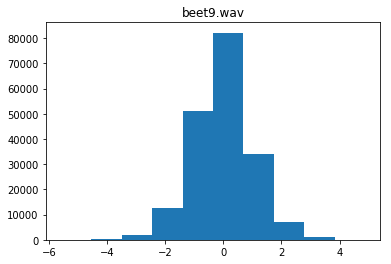

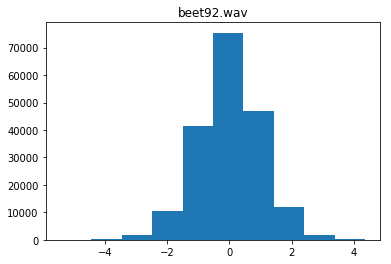

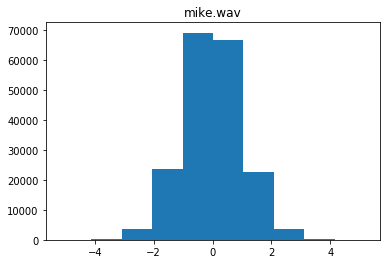

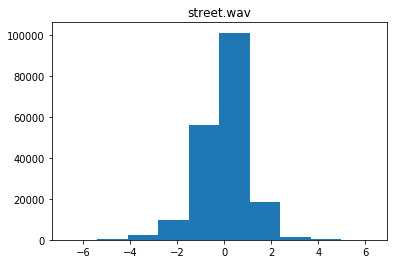

Mixed audio signals

##############################
# Activation function Phi_0 #
##############################

##############################
######## Starting ICA ########
##############################

Settings:
Activation function: <function phi_0 at 0x0000020F208D0950>
Learning rate: 0.01

Step: 0, grad: 0.9497822016859307
Step: 500, grad: 0.1859951601796042
Step: 1000, grad: 0.2143944541351771
Step: 1500, grad: 0.11827551695644176
Step: 2000, grad: 0.020284995943863106
Step: 2500, grad: 0.005331851402692002
Step: 3000, grad: 0.0019652428527688723
Step: 3500, grad: 0.000808500855325801
Step: 4000, grad: 0.0003406166230022668
Step: 4500, grad: 0.00014424569903416737
Step: 5000, grad: 6.116732990247733e-05
Step: 5500, grad: 2.594871753715993e-05
Step: 6000, grad: 1.1009729550084233e-05

Done! ICA terminated with at the following step:
Step: 6057, grad: 9.984630156093411e-06

##############################
######### End of ICA #########
##############################



De-mixed audio signals

##############################
# Activation function Phi_1 #
##############################

##############################
######## Starting ICA ########
##############################

Settings:
Activation function: <function phi_1 at 0x0000020F208D0B70>
Learning rate: 0.01

Step: 0, grad: 1.2939150126947323
Step: 500, grad: 0.07800510044302607
Step: 1000, grad: 0.06734449771735072
Step: 1500, grad: 0.05650253292364685
Step: 2000, grad: 0.04434817393823482
Step: 2500, grad: 0.03301733413063685
Step: 3000, grad: 0.023790651558386756
Step: 3500, grad: 0.016915120771665636
Step: 4000, grad: 0.012037919974296197
Step: 4500, grad: 0.008672996372643058
Step: 5000, grad: 0.00641378371068633
Step: 5500, grad: 0.004968201951233631
Step: 6000, grad: 0.004125693007027386
Step: 6500, grad: 0.0037136549259736105
Step: 7000, grad: 0.0035790197527907266
Step: 7500, grad: 0.003598886132609078
Step: 8000, grad: 0.0036896083753996584
Step: 8500, grad: 0.003800537276369163
Step: 9000, grad: 0.003902459

De-mixed audio signals

##############################
# Activation function Phi_2 #
##############################

##############################
######## Starting ICA ########
##############################

Settings:
Activation function: <function phi_2 at 0x0000020F2091C1E0>
Learning rate: 0.01

Step: 0, grad: 7.110697607460322
Step: 500, grad: 0.07608864122658518
Step: 1000, grad: 0.04308488461422764
Step: 1500, grad: 0.022081856906088985
Step: 2000, grad: 0.012157002627932071
Step: 2500, grad: 0.008074639255953897
Step: 3000, grad: 0.0075130355443093
Step: 3500, grad: 0.008248074643379752
Step: 4000, grad: 0.008795382726865895
Step: 4500, grad: 0.008871184366592136
Step: 5000, grad: 0.008934658955325234
Step: 5500, grad: 0.009395022087644096
Step: 6000, grad: 0.01026916068482823
Step: 6500, grad: 0.011396305199658303
Step: 7000, grad: 0.012549595820047712
Step: 7500, grad: 0.013367503094202196
Step: 8000, grad: 0.013407908220707598
Step: 8500, grad: 0.012497301579716695
Step: 9000, grad: 0.010974154582

De-mixed audio signals

##############################
# Activation function Phi_3 #
##############################

##############################
######## Starting ICA ########
##############################

Settings:
Activation function: <function phi_3 at 0x0000020F208D00D0>
Learning rate: 0.01

Step: 0, grad: 0.5386997913558349
Step: 500, grad: 0.13943194694483263
Step: 1000, grad: 0.14249310587383904
Step: 1500, grad: 0.11566364873015639
Step: 2000, grad: 0.02861910205386889
Step: 2500, grad: 0.008149948415188488
Step: 3000, grad: 0.002890413539967743
Step: 3500, grad: 0.0011806550536019886
Step: 4000, grad: 0.0005199968613772281
Step: 4500, grad: 0.00023702198654920498
Step: 5000, grad: 0.0001096185760837972
Step: 5500, grad: 5.100429074217283e-05
Step: 6000, grad: 2.379249417696698e-05
Step: 6500, grad: 1.1111116245849398e-05

Done! ICA terminated with at the following step:
Step: 6570, grad: 9.988111783072992e-06

##############################
######### End of ICA #########
########################

De-mixed audio signals

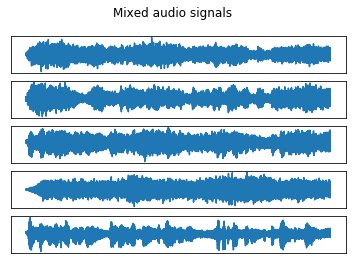

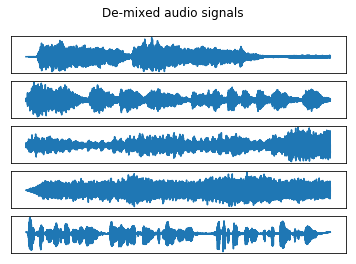

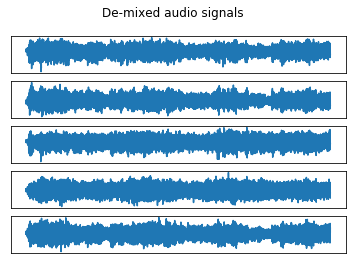

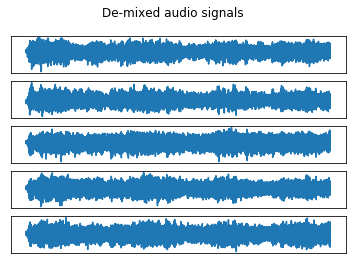

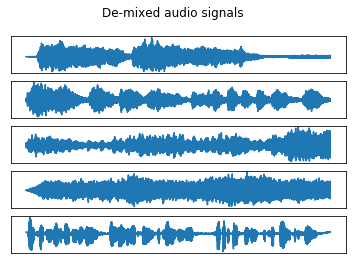

In [32]:
### 1.9 Audio demixing
# YOUR CODE HERE
# raise NotImplementedError()

# mix the audio signals
A_audio = random_nonsingular_matrix(d=S_audio.shape[0])
X_audio = make_mixtures(S_audio, A_audio)


print('#' * 50)
print('#' * 18 + ' Non-whitened ' + '#' * 18)
print('#' * 50)
print()

# plot the histograms
print('Histograms of the mixed audio')
plot_histograms(X_audio, source_files)

plot_signals(X_audio, 'Mixed audio signals')
play_signals(X_audio, sample_rate, 'Mixed audio signals')


print('#' * 50)
print('#' * 20 + ' Whitened ' + '#' * 20)
print('#' * 50)
print()

# whiten the mixed audio
Xw_audio = whiten(X_audio)

print('Histograms of the whitened mixed audio')
plot_histograms(Xw_audio, source_files)

plot_signals(Xw_audio, 'Mixed audio signals')
play_signals(Xw_audio, sample_rate, 'Mixed audio signals')

# use ICA to de-mix the audio signals
for i, phi in enumerate(activation_functions):
    print('#' * 30)
    print('#' + f' Activation function Phi_{i} ' + '#')
    print('#' * 30)
    print()
    W_audio_est = ICA(Xw_audio, phi, learning_rate=0.01, print_every=500)
    S_audio_est = W_audio_est @ Xw_audio
    
    plot_signals(S_audio_est, 'De-mixed audio signals')
    play_signals(S_audio_est, sample_rate, 'De-mixed audio signals')

Report your results. Using which activation functions ICA recovers the sources?

Using activation functions $\phi_0$ and $\phi_3$ recovers the sources from the mixed audio really well. Activation functions $\phi_1$ and $\phi_2$ perform quite poorly: the de-mixed audio signals are still quite mixed.

### 1.10 Excess Kurtosis (15 points)
The (excess) kurtosis is a measure of 'peakedness' of a distribution. It is defined as
$$
\verb+Kurt+[X] = \frac{\mu_4}{\sigma^4} - 3 = \frac{\operatorname{E}[(X-{\mu})^4]}{(\operatorname{E}[(X-{\mu})^2])^2} - 3
$$
Here, $\mu_4$ is known as the fourth moment about the mean, and $\sigma$ is the standard deviation.
The '-3' term is introduced so that a Gaussian random variable has 0 excess kurtosis.
We will now try to understand the performance of the various activation functions by considering the kurtosis of the corresponding priors, and comparing those to the empirical kurtosis of our data.

#### 1.10.1 (10 points)
First, compute analytically the kurtosis of the four priors that you derived from the activation functions before. You may find it helpful to use an online service such as [Wolfram Alpha](https://www.wolframalpha.com/) or [Integral Calculator](https://www.integral-calculator.com/) to (help you) evaluate the required integrals. Give your answer as both an exact expression as well as a numerical approximation (for example $\frac{\pi}{2} \approx 1.571$).

As all considered prior are centered around 0, we have $\mu_i = 0, \quad \forall i$. Before we can proceed to analytically compute the kurtosis of one of our priors $p_i$, we need to define their normalizing constant $c_i$, such that:
$$p_i(x) \propto f_i(x) $$
$$c_i(x) = \int_{-\infty}^{+\infty} f_i(x) dx$$

As such, for the first prior $p_0(x)$, we have:
$$c_0(x) = \int_{-\infty}^{+\infty} \frac{1}{cosh(a)} dx = \pi$$
$$\operatorname{E}[X^4] \int_{-\infty}^{+\infty} p_0(x) x^4 dx$$

In [ ]:
### Include your answer here (you can use math.gamma if needed)
def get_kurtosis():
    # Return a list with 4 numbers / expressions
    # return [0, 0, 0, 0]
    
    # YOUR CODE HERE
    raise NotImplementedError()
    

In [ ]:
# Let's check
kurtosis = get_kurtosis()
print (kurtosis)
assert len(kurtosis) == 4


#### 1.10.2 (5 points)
Now use the `scipy.stats.kurtosis` function, with the `fisher` option set to `True`, to compute the empirical kurtosis of the dummy signals and the real audio signals.

Can you use this data to explain the performance of the various activation functions on the synthetic and real data?

In [ ]:
### 1.10.2 Excess Kurtosis
# YOUR CODE HERE
raise NotImplementedError()

YOUR ANSWER HERE